# CycleGAN 실습

## 사용 라이브러리

In [1]:
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.losses import mean_squared_error, mean_absolute_error

import os
import time
import matplotlib.pyplot as plt
import numpy as np
import sys
sys.maxsize=22222222

In [2]:
import tensorflow_datasets as tfds

In [3]:
!python --version

Python 3.8.5


## 데이터셋 불러오기

In [4]:
train_real, metadata_real = tfds.load('domainnet/real', with_info=True, as_supervised=True)

In [5]:
train_quickdraw, metadata_quickdraw = tfds.load('domainnet/quickdraw', with_info=True, as_supervised=True)

In [6]:
train_real, test_real = train_real['train'], train_real['test'] 
train_quickdraw, test_quickdraw = train_quickdraw['train'], train_quickdraw['test']

## 기본 설정 및 데이터 준비

In [7]:
def normalize(input_image, label) :
    input_image = tf.image.resize(input_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    input_image = tf.cast(input_image, tf.float32)
    input_image = (input_image/127.5) -1
    return input_image

In [10]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
EPOCHS = 50
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [11]:
train_A = train_real.map(normalize, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
test_A = test_real.map(normalize, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train_B = train_quickdraw.map(normalize, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
test_B = test_quickdraw.map(normalize, num_parallel_calls=AUTOTUNE).cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [12]:
inpA = next(iter(train_A))
inpB = next(iter(train_B))

## 데이터 확인

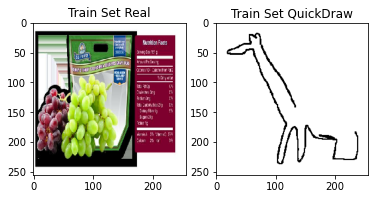

In [13]:
plt.subplot(121)
plt.title("Train Set Real")
plt.imshow(inpA[0]*0.5+0.5)
plt.subplot(122)
plt.title("Train Set QuickDraw")
plt.imshow(inpB[0]*0.5+0.5)

## Encoding 함수

In [14]:
def downsample(filters, size=3, apply_batchnorm=True) :
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                              kernel_initializer=initializer, use_bias=False)
    )
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    
    return result

## Decoding 함수

In [15]:
def upsample(filters, size=3, apply_dropout=False) :
    initializer = tf.random_normal_initializer(0., 0.02)
    
    result = tf.keras.Sequential()
    result.add(
        tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                       padding='same',
                                       kernel_initializer=initializer,
                                       use_bias=False)
    )
    result.add(tf.keras.layers.BatchNormalization())
    
    if apply_dropout :
        result.add(tf.keras.layers.Dropout(0.5))
    
    result.add(tf.keras.layers.ReLU())
    
    return result

## ResNet 블록

In [16]:
class ResnetIdentityBlock(tf.keras.Model) :
    def __init__(self, kernel_size, filters, name) :
        super(ResnetIdentityBlock, self).__init__(name=name)
        filters1, filters2, filters3 = filters
        
        self.conv2a = tf.keras.layers.Conv2D(filters1, (1, 1))
        self.bn2a = tf.keras.layers.BatchNormalization()
        
        self.conv2b = tf.keras.layers.Conv2D(filters2, kernel_size, padding='same')
        self.bn2b = tf.keras.layers.BatchNormalization()
        
        self.conv2c = tf.keras.layers.Conv2D(filters3, (1, 1))
        self.bn2c = tf.keras.layers.BatchNormalization()
        
    def call(self, input_tensor, training=False) :
        x = self.conv2a(input_tensor)
        x = self.bn2a(x, training=training)
        x = tf.nn.relu(x)
        
        x = self.conv2b(x)
        x = self.bn2b(x, training=training)
        x = tf.nn.relu(x)
        
        x = self.conv2c(x)
        x = self.bn2c(x, training=training)
        
        x+= input_tensor
        return tf.nn.relu(x)
    
block1 = ResnetIdentityBlock(3, [512, 512, 512], 'block1')
block2 = ResnetIdentityBlock(3, [512, 512, 512], 'block2')
block3 = ResnetIdentityBlock(3, [512, 512, 512], 'block3')

resnet = [block1, block2, block3]

## 생성기

In [17]:
def Generator():
    down_stack = [
        downsample(64, 4, apply_batchnorm=False), 
        downsample(128, 4),
        downsample(256, 4), 
        downsample(512, 4) 
    ]

    up_stack = [
        upsample(256, 4),
        upsample(128, 4), 
        upsample(64, 4), 
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') 


    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
        
    for block in resnet:
        x = block(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        concat = tf.keras.layers.Concatenate()
        x = up(x)
        x = concat([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [18]:
generator = Generator()

In [19]:
generator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 64, 64, 128)  131584      sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, 32, 32, 256)  525312      sequential_1[0][0]               
______________________________________________________________________________________________

(1, 256, 256, 3) 0.53952926 0.45628121


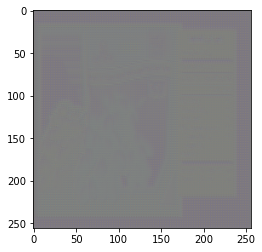

In [20]:
gen_output = generator(inpA, training=False)
gen_output = (gen_output + 1) / 2
plt.imshow(gen_output[0])
print(gen_output.shape, gen_output[0,...].numpy().max(), gen_output[0,...].numpy().min())

## 판별기

In [21]:
def Discriminator() :
    inputs = tf.keras.layers.Input(shape=[None, None, 3])
    x = inputs
    g_filter = 64
    
    down_stack = [
        downsample(g_filter),
        downsample(g_filter * 2),
        downsample(g_filter * 4),
        downsample(g_filter * 8),
    ]
    
    for down in down_stack :
        x = down(x)
        
    last = tf.keras.layers.Conv2D(1, 4, strides=1, padding='same')
    x = last(x)
    
    return tf.keras.Model(inputs=inputs, outputs=x)

In [22]:
discriminator = Discriminator()
dis_output = discriminator(inpA, training=False)
print(dis_output.shape)

(1, 16, 16, 1)


In [23]:
discriminator_A = Discriminator()
discriminator_B = Discriminator()

generator_AB = Generator()
generator_BA = Generator()

## 손실함수

In [24]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [25]:
@tf.function
def discriminator_loss(disc_real_output, disc_generated_output) :
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

In [26]:
optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

In [27]:
valid = np.ones((BATCH_SIZE, 16, 16, 1)).astype('float32')
fake = np.zeros((BATCH_SIZE, 16, 16, 1)).astype('float32')

In [28]:
@tf.function
def train_batch(imgs_A, imgs_B):
    with tf.GradientTape() as g, tf.GradientTape() as d_tape:
        fake_B = generator_AB(imgs_A, training=True)
        fake_A = generator_BA(imgs_B, training=True)
        
        logits_real_A = discriminator_A(imgs_A, training=True)
        logits_fake_A = discriminator_A(fake_A, training=True)
        dA_loss = discriminator_loss(logits_real_A, logits_fake_A)
        
        logits_real_B = discriminator_B(imgs_B, training=True)
        logits_fake_B = discriminator_B(fake_B, training=True)
        dB_loss = discriminator_loss(logits_real_B, logits_fake_B)
        
        d_loss = (dA_loss + dB_loss) / 2
        # Translate images back to original domain
        reconstr_A = generator_BA(fake_B, training=True)
        reconstr_B = generator_AB(fake_A, training=True)
        
        id_A = generator_BA(imgs_A, training=True)
        id_B = generator_AB(imgs_B, training=True)


        gen_loss = tf.math.reduce_sum([
            1 * tf.math.reduce_mean(mean_squared_error(logits_fake_A, valid)),
            1 * tf.math.reduce_mean(mean_squared_error(logits_fake_B, valid)),
            10 * tf.math.reduce_mean(mean_squared_error(reconstr_A, imgs_A)),
            10 * tf.math.reduce_mean(mean_squared_error(reconstr_B, imgs_B)),
            0.1 * tf.math.reduce_mean(mean_squared_error(id_A, imgs_A)),
            0.1 * tf.math.reduce_mean(mean_squared_error(id_B, imgs_B)),
        ])
        
    gradients_of_d = d_tape.gradient(d_loss, discriminator_A.trainable_variables + discriminator_B.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(gradients_of_d, discriminator_A.trainable_variables + discriminator_B.trainable_variables))

    gradients_of_generator = g.gradient(gen_loss, generator_AB.trainable_variables + generator_BA.trainable_variables)
    optimizer.apply_gradients(zip(gradients_of_generator, generator_AB.trainable_variables + generator_BA.trainable_variables))
    
    return dA_loss, dB_loss, gen_loss

## 체크포인트 저장 위치 설정

In [29]:
checkpoint_dird_A = './training_checkpointsd_A'
checkpoint_prefixd_A = os.path.join(checkpoint_dird_A, "ckpt_{epoch}")

checkpoint_dird_B = './training_checkpointsd_B'
checkpoint_prefixd_B = os.path.join(checkpoint_dird_B, "ckpt_{epoch}")

checkpoint_dirg_AB = './training_checkpointsg_AB'
checkpoint_prefixg_AB = os.path.join(checkpoint_dirg_AB, "ckpt_{epoch}")

checkpoint_dirg_BA = './training_checkpointsg_BA'
checkpoint_prefixg_BA = os.path.join(checkpoint_dirg_BA, "ckpt_{epoch}")

## 학습

In [30]:
def train(trainA_, trainB_, epochs):
    for epoch in range(epochs):
        start = time.time()
        
        for batch_i, (imgs_A, imgs_B) in enumerate(zip(trainA_, trainB_)):
            dA_loss, dB_loss, g_loss = train_batch(imgs_A, imgs_B)
            
            if batch_i % 1000 == 0:
                test_imgA = next(iter(test_A))
                test_imgB = next(iter(test_B))
                print ('Time taken for epoch {} batch index {} is {} seconds\n'.format(epoch, batch_i, time.time()-start))
                print("discriminator A: ", dA_loss.numpy())
                print("discriminator B: ", dB_loss.numpy())
                print("generator: {}\n".format(g_loss))

                fig, axs = plt.subplots(2, 2, figsize=(10, 10), sharey=True, sharex=True)
                gen_outputA = generator_AB(test_imgA, training=False)
                gen_outputB = generator_BA(test_imgB, training=False)
                axs[0,0].imshow(test_imgA[0]*0.5 + 0.5)
                axs[0,0].set_title("Generator A Input")
                axs[0,1].imshow(gen_outputA[0]*0.5 + 0.5)
                axs[0,1].set_title("Generator A Output")
                axs[1,0].imshow(test_imgB[0]*0.5 + 0.5)
                axs[1,0].set_title("Generator B Input")
                axs[1,1].imshow(gen_outputB[0]*0.5 + 0.5)
                axs[1,1].set_title("Generator B Output")
                plt.show()

                discriminator_A.save_weights(checkpoint_prefixd_A.format(epoch=epoch))
                discriminator_B.save_weights(checkpoint_prefixd_B.format(epoch=epoch))
                generator_AB.save_weights(checkpoint_prefixg_AB.format(epoch=epoch))
                generator_BA.save_weights(checkpoint_prefixg_BA.format(epoch=epoch))

Time taken for epoch 0 batch index 0 is 12.432000160217285 seconds

discriminator A:  1.6065974
discriminator B:  1.5405266
generator: 18.004987716674805



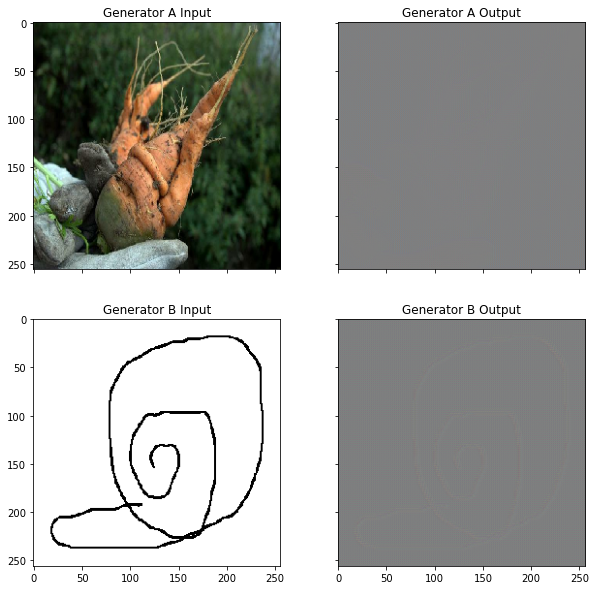

Time taken for epoch 0 batch index 1000 is 112.45549988746643 seconds

discriminator A:  0.5527227
discriminator B:  0.020758882
generator: 49.748538970947266



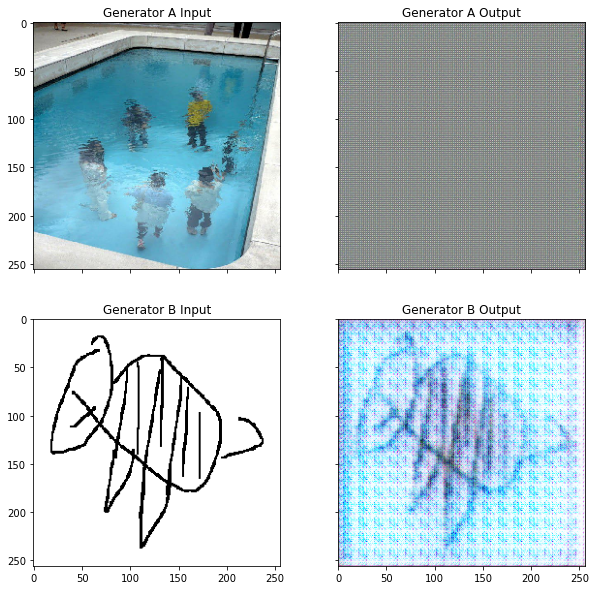

Time taken for epoch 0 batch index 2000 is 212.59611582756042 seconds

discriminator A:  1.0851257
discriminator B:  0.18567082
generator: 28.80206298828125



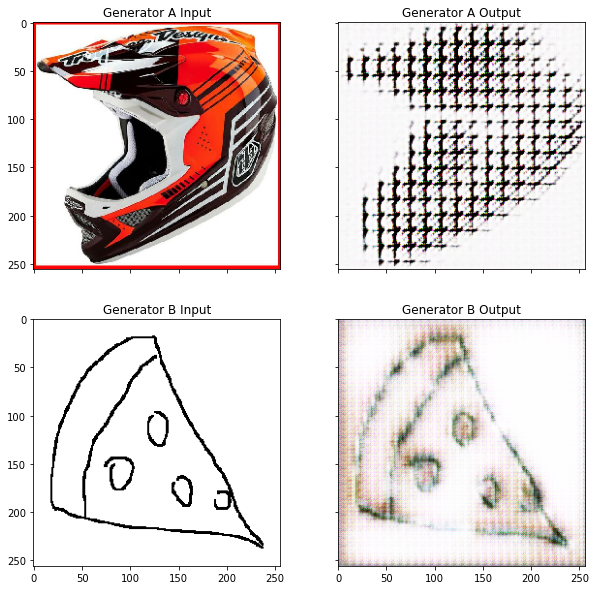

Time taken for epoch 0 batch index 3000 is 312.9214804172516 seconds

discriminator A:  0.76449203
discriminator B:  0.060620572
generator: 37.14531326293945



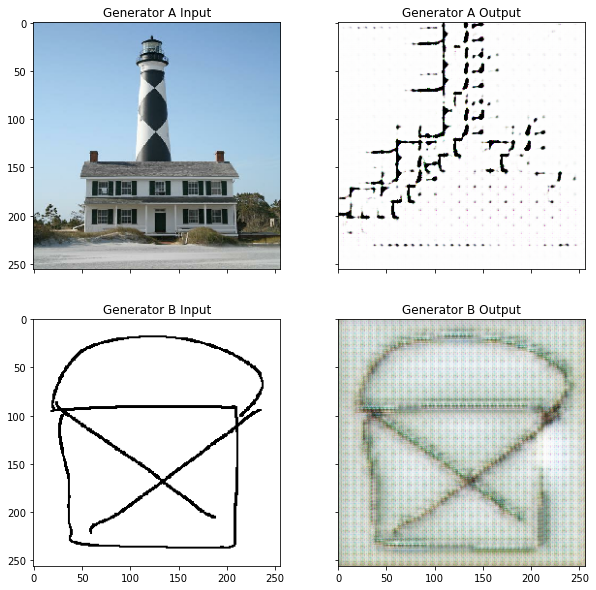

Time taken for epoch 0 batch index 4000 is 414.0506272315979 seconds

discriminator A:  1.0999198
discriminator B:  0.11723508
generator: 29.388151168823242



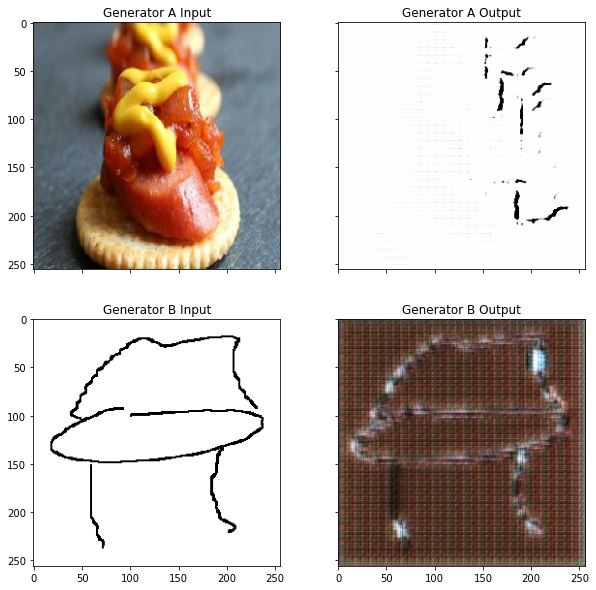

Time taken for epoch 0 batch index 5000 is 516.0718026161194 seconds

discriminator A:  0.6931925
discriminator B:  0.07913138
generator: 26.209566116333008



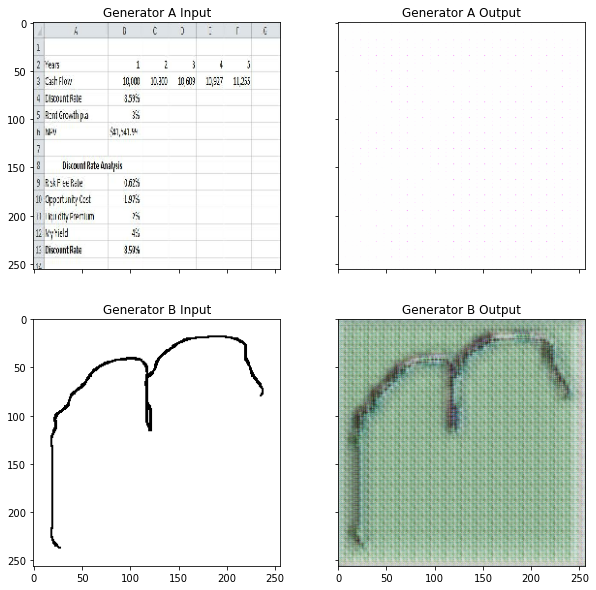

Time taken for epoch 0 batch index 6000 is 619.1446433067322 seconds

discriminator A:  1.3665749
discriminator B:  0.26639092
generator: 22.252954483032227



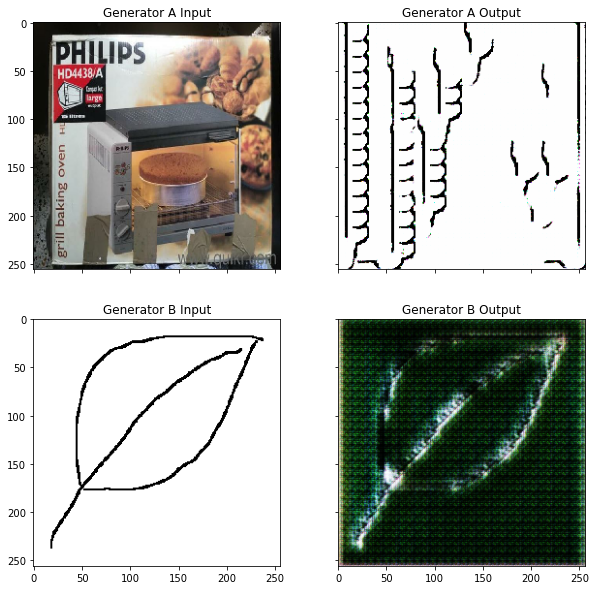

Time taken for epoch 0 batch index 7000 is 722.014256477356 seconds

discriminator A:  0.64286554
discriminator B:  0.26833087
generator: 17.084701538085938



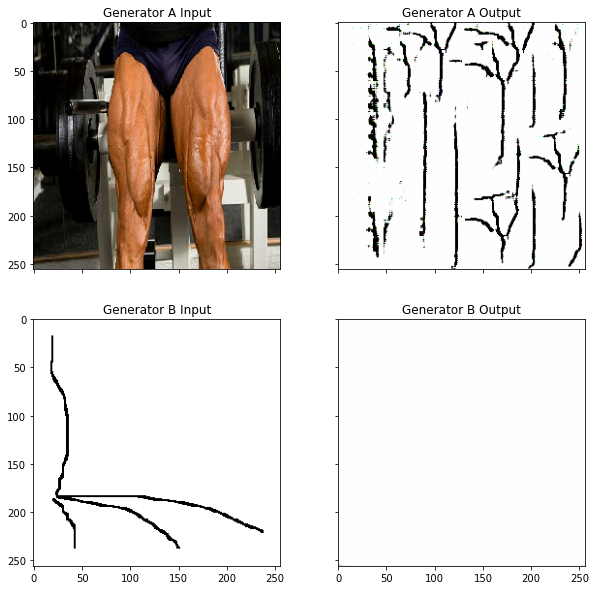

Time taken for epoch 0 batch index 8000 is 825.1192901134491 seconds

discriminator A:  0.6814664
discriminator B:  1.8501419
generator: 36.20094299316406



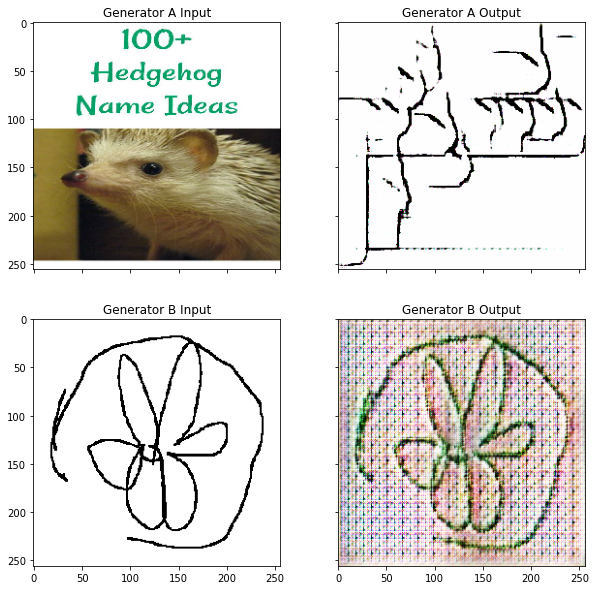

Time taken for epoch 0 batch index 9000 is 929.2442364692688 seconds

discriminator A:  0.92313147
discriminator B:  0.08031633
generator: 44.52988815307617



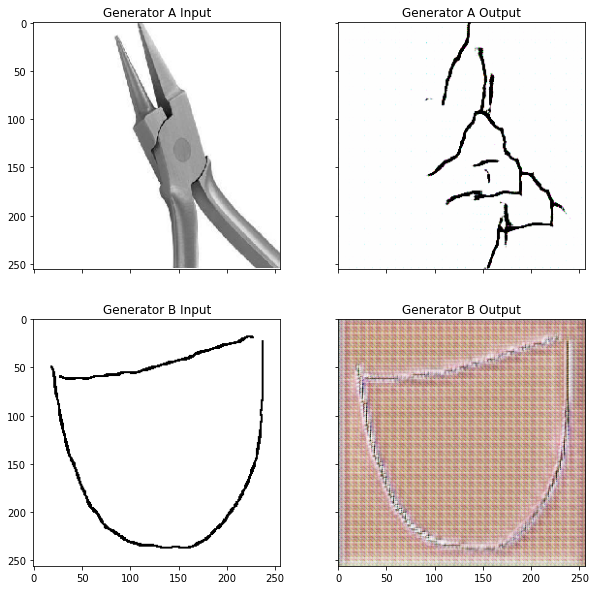

Time taken for epoch 0 batch index 10000 is 1031.8091444969177 seconds

discriminator A:  0.33525872
discriminator B:  0.03103634
generator: 57.06888198852539



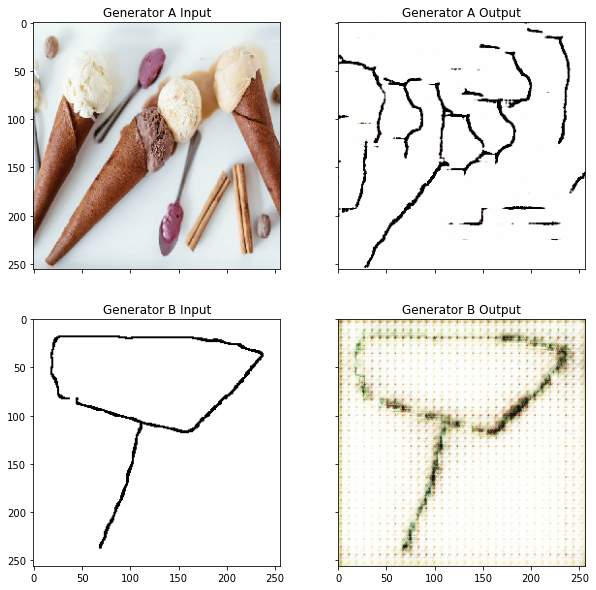

Time taken for epoch 0 batch index 11000 is 1133.6546976566315 seconds

discriminator A:  0.818576
discriminator B:  0.027083158
generator: 42.888790130615234



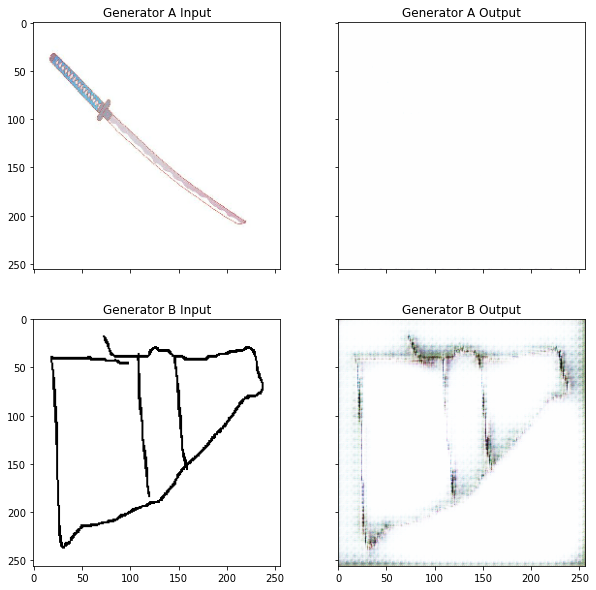

Time taken for epoch 0 batch index 12000 is 1236.6786222457886 seconds

discriminator A:  0.97052544
discriminator B:  0.179195
generator: 17.2078914642334



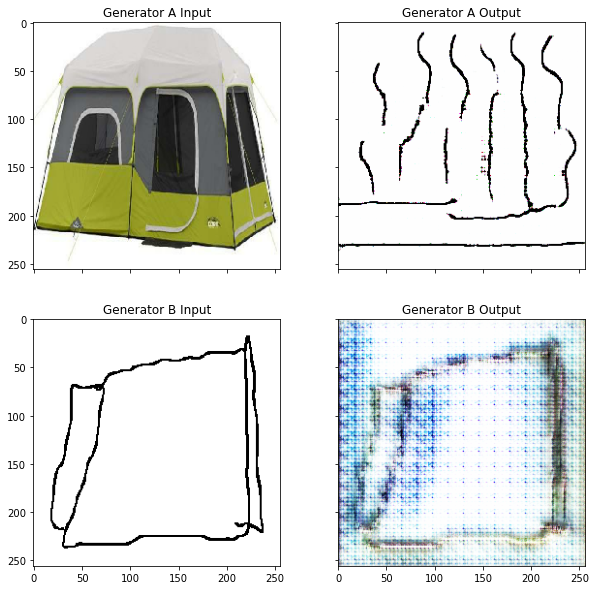

Time taken for epoch 0 batch index 13000 is 1341.1461226940155 seconds

discriminator A:  0.3187196
discriminator B:  0.562715
generator: 21.149028778076172



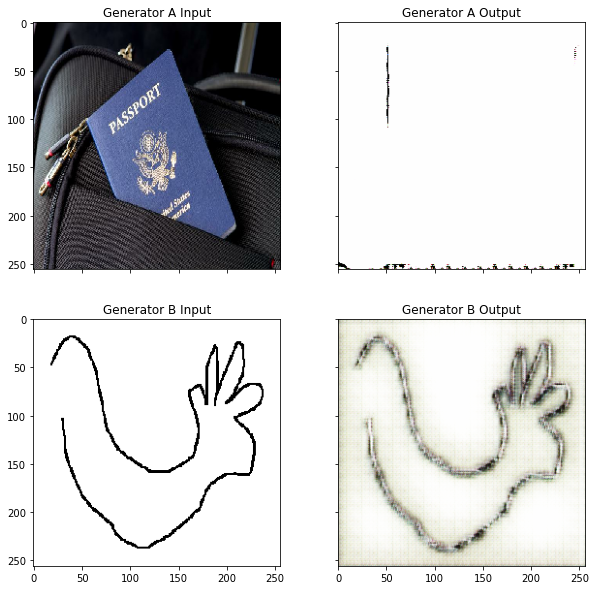

Time taken for epoch 0 batch index 14000 is 1444.8299322128296 seconds

discriminator A:  0.54298383
discriminator B:  0.23152705
generator: 24.304258346557617



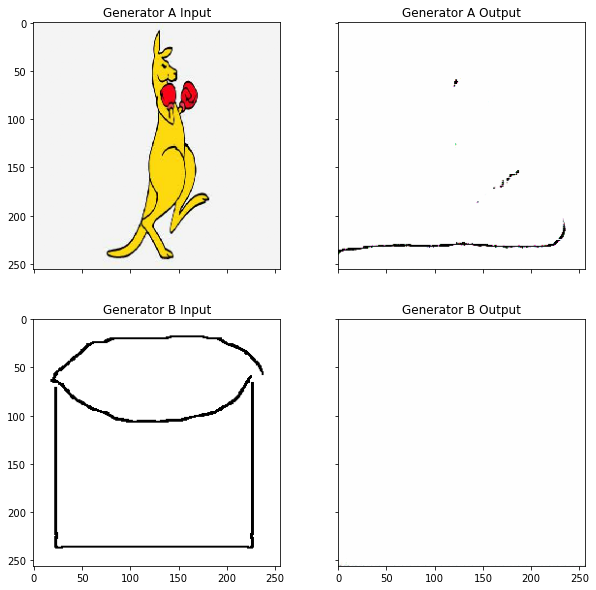

Time taken for epoch 0 batch index 15000 is 1546.9362058639526 seconds

discriminator A:  0.19824502
discriminator B:  0.049534287
generator: 56.705379486083984



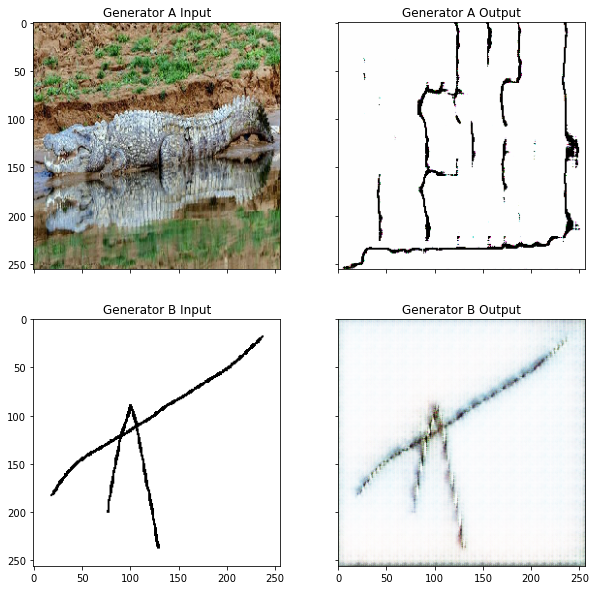

Time taken for epoch 0 batch index 16000 is 1649.7094478607178 seconds

discriminator A:  0.3522297
discriminator B:  0.20698625
generator: 57.23772430419922



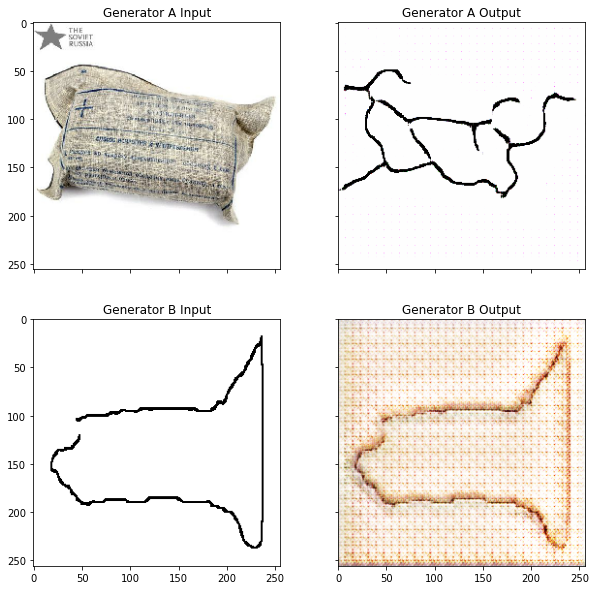

Time taken for epoch 0 batch index 17000 is 1752.2566285133362 seconds

discriminator A:  1.5187185
discriminator B:  0.39008135
generator: 68.03326416015625



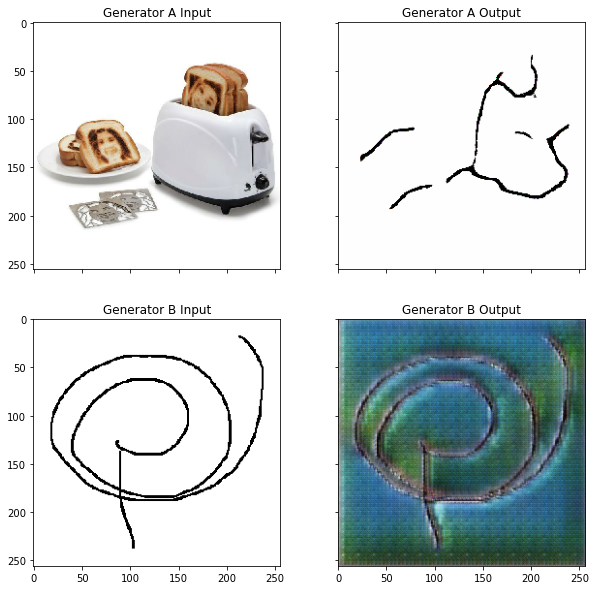

Time taken for epoch 0 batch index 18000 is 1856.5119771957397 seconds

discriminator A:  0.3482643
discriminator B:  0.26121736
generator: 22.271329879760742



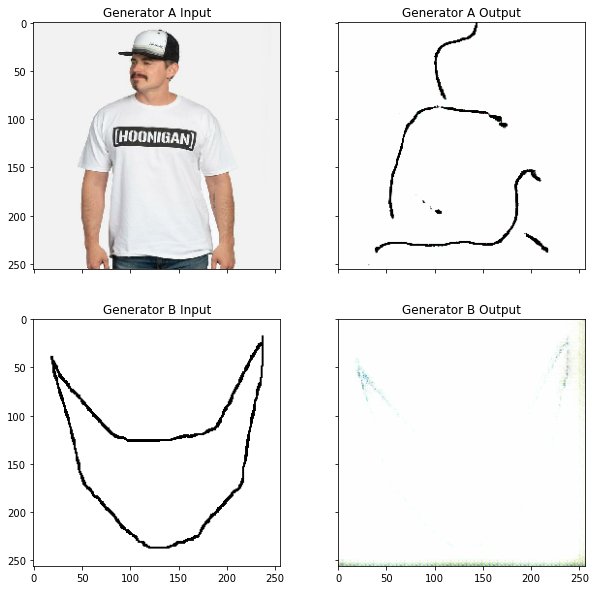

Time taken for epoch 0 batch index 19000 is 1959.3524312973022 seconds

discriminator A:  0.44572496
discriminator B:  0.12271855
generator: 55.52370834350586



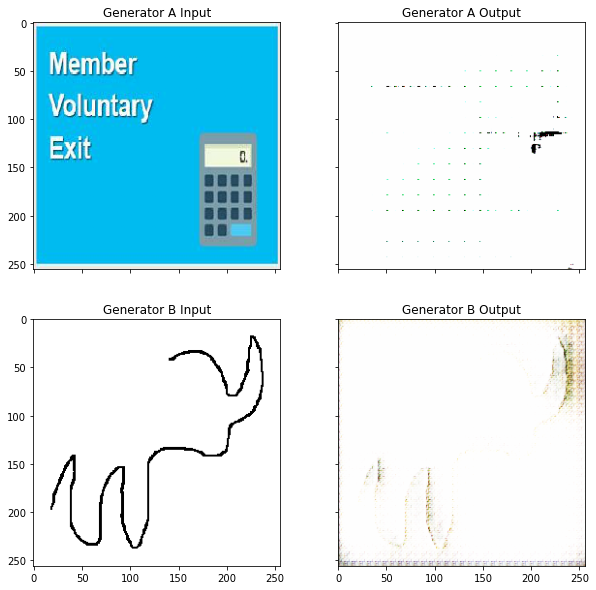

Time taken for epoch 0 batch index 20000 is 2062.947066783905 seconds

discriminator A:  0.87630117
discriminator B:  0.528586
generator: 18.576066970825195



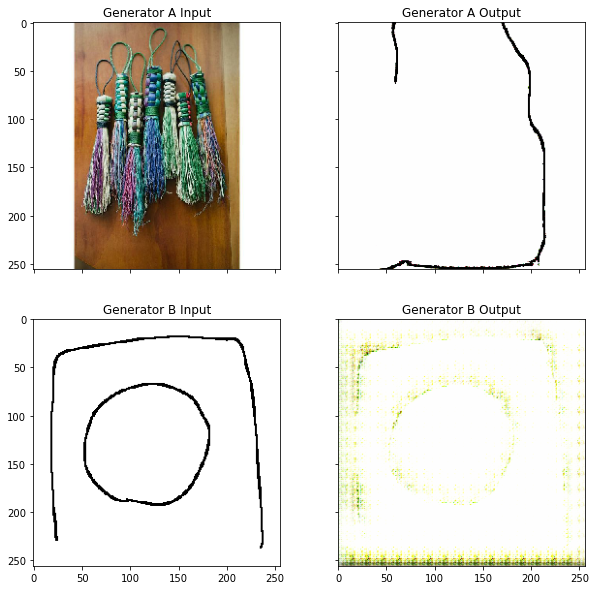

Time taken for epoch 0 batch index 21000 is 2166.69921708107 seconds

discriminator A:  0.1488783
discriminator B:  0.0088175945
generator: 93.48473358154297



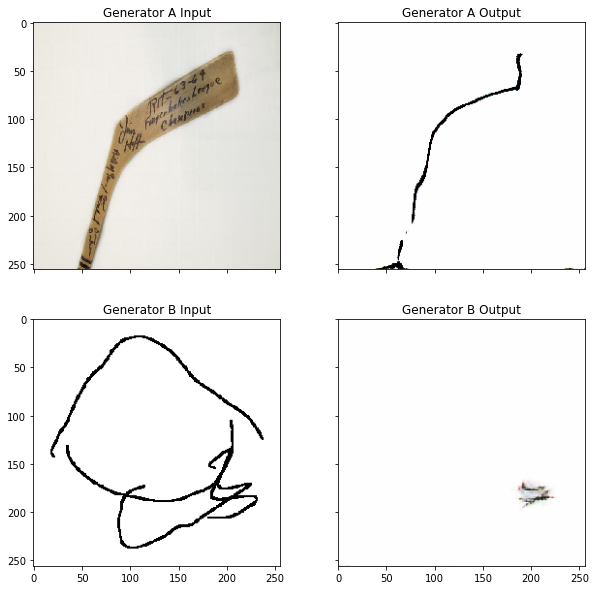

Time taken for epoch 0 batch index 22000 is 2270.090899705887 seconds

discriminator A:  0.8140441
discriminator B:  0.07213715
generator: 33.280216217041016



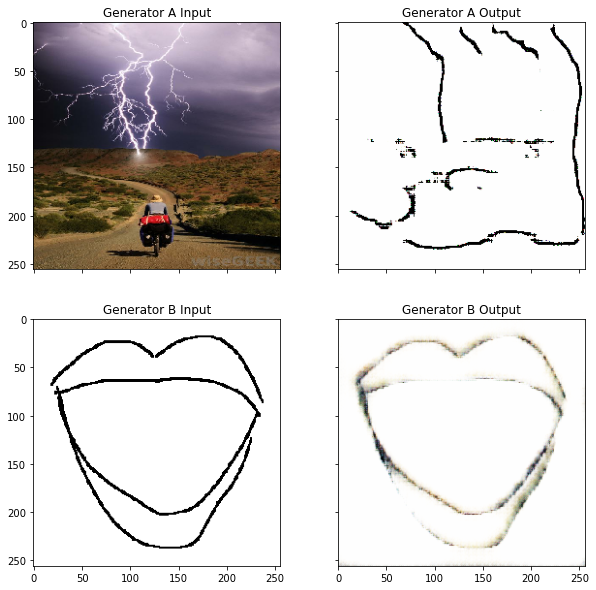

Time taken for epoch 0 batch index 23000 is 2376.950311899185 seconds

discriminator A:  0.18861236
discriminator B:  0.58202827
generator: 22.183622360229492



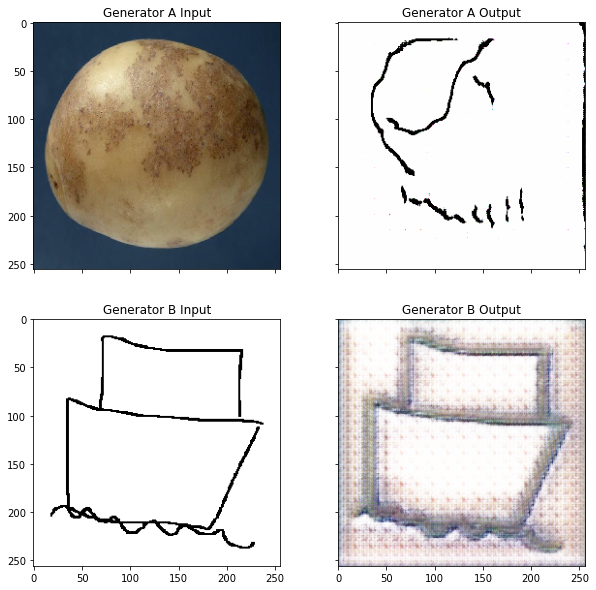

Time taken for epoch 0 batch index 24000 is 2481.87251663208 seconds

discriminator A:  0.42800412
discriminator B:  0.02121889
generator: 101.72602844238281



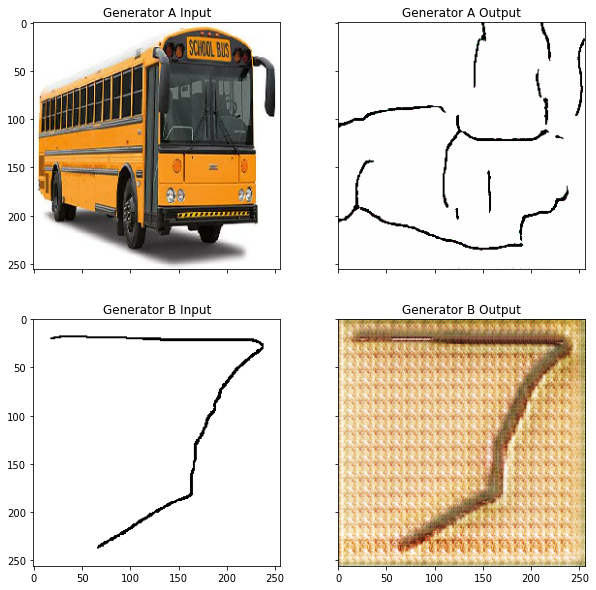

Time taken for epoch 0 batch index 25000 is 2586.5018849372864 seconds

discriminator A:  1.2998978
discriminator B:  0.5706884
generator: 16.775310516357422



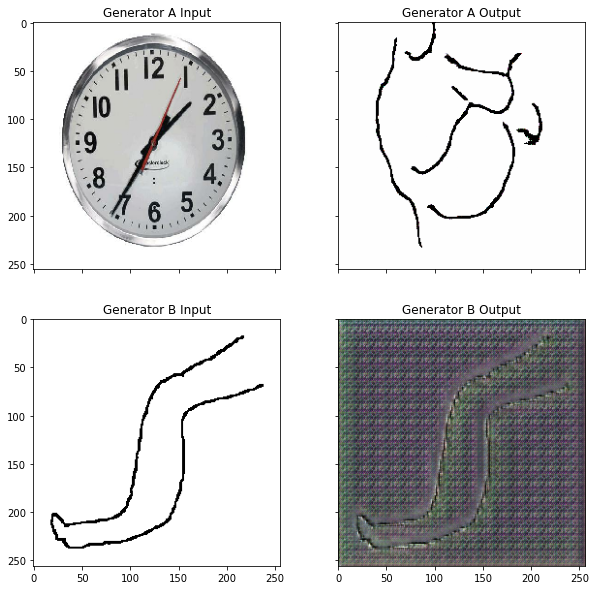

Time taken for epoch 0 batch index 26000 is 2691.8686530590057 seconds

discriminator A:  0.15878141
discriminator B:  0.035262078
generator: 83.9941177368164



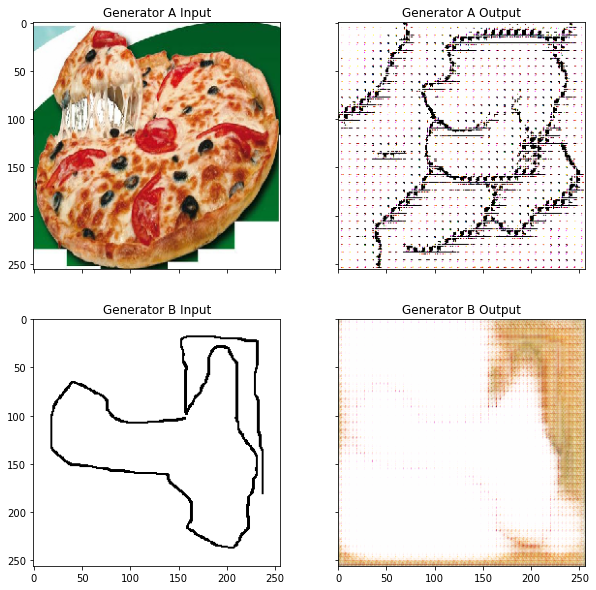

Time taken for epoch 0 batch index 27000 is 2798.481367111206 seconds

discriminator A:  1.3080076
discriminator B:  0.021491628
generator: 51.331260681152344



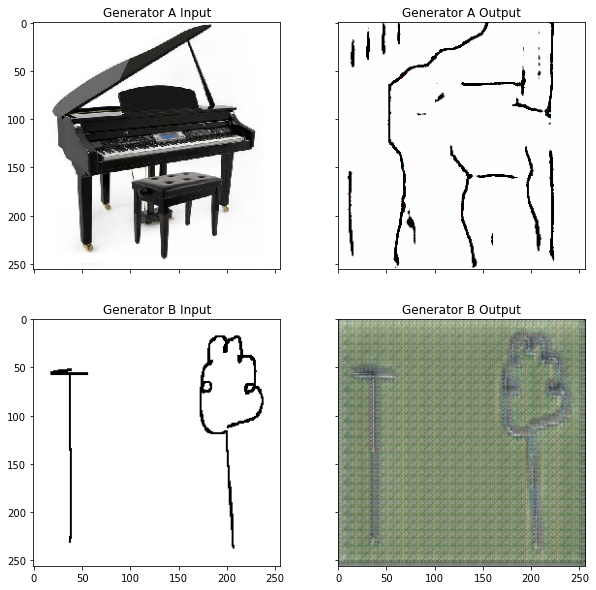

Time taken for epoch 0 batch index 28000 is 2905.5632219314575 seconds

discriminator A:  0.8149952
discriminator B:  0.11485031
generator: 44.75594711303711



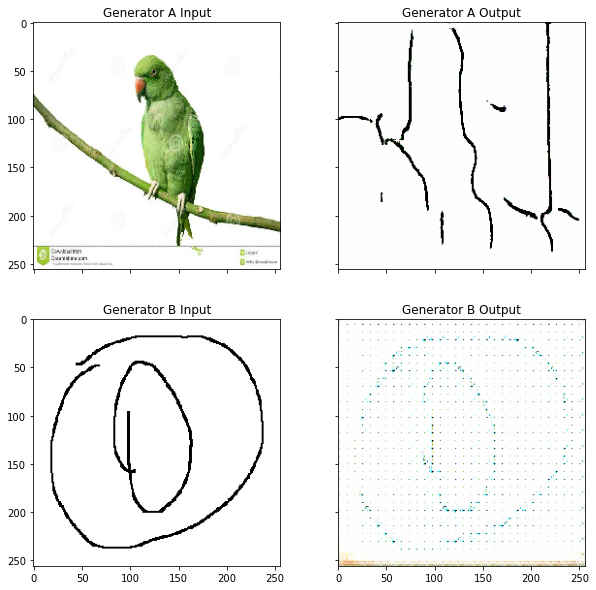

Time taken for epoch 0 batch index 29000 is 3014.3500266075134 seconds

discriminator A:  1.2150296
discriminator B:  0.21947116
generator: 27.392837524414062



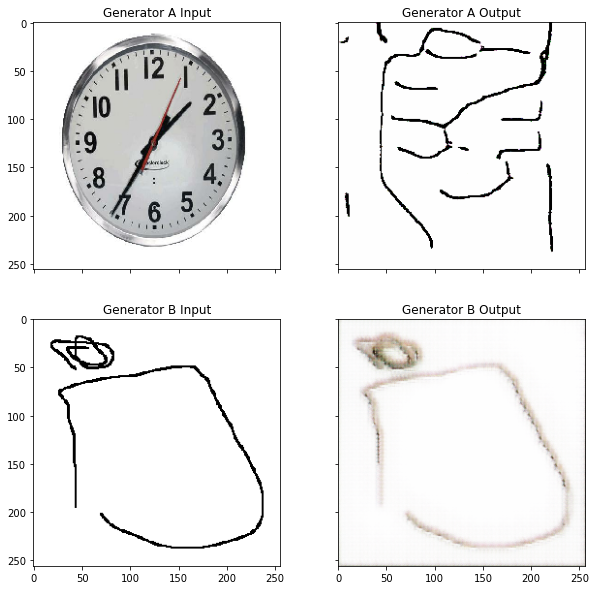

Time taken for epoch 0 batch index 30000 is 3122.8142380714417 seconds

discriminator A:  0.38477477
discriminator B:  0.62063444
generator: 14.442890167236328



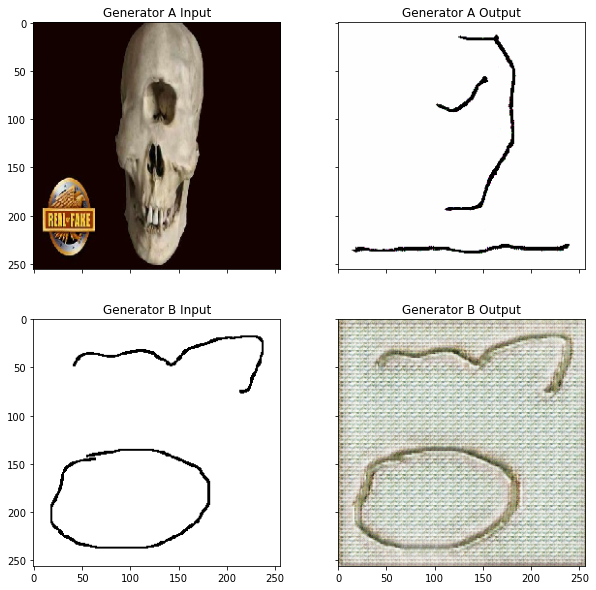

Time taken for epoch 0 batch index 31000 is 3231.458238363266 seconds

discriminator A:  1.4272103
discriminator B:  0.01788946
generator: 144.85638427734375



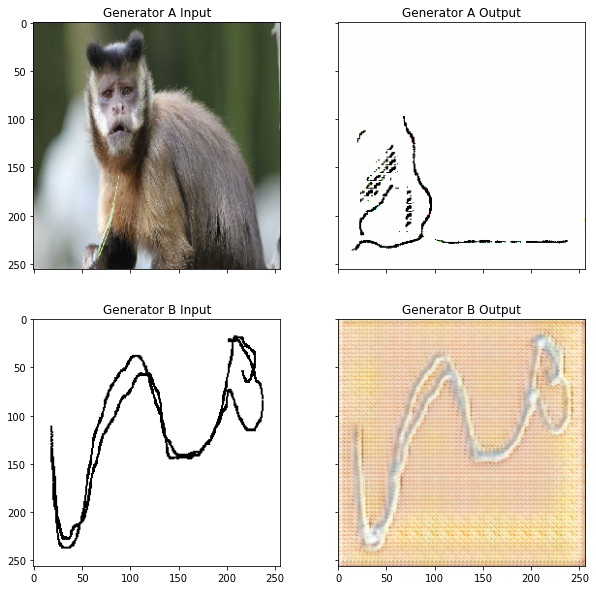

Time taken for epoch 0 batch index 32000 is 3340.954671382904 seconds

discriminator A:  2.1653056
discriminator B:  0.01726098
generator: 69.58919525146484



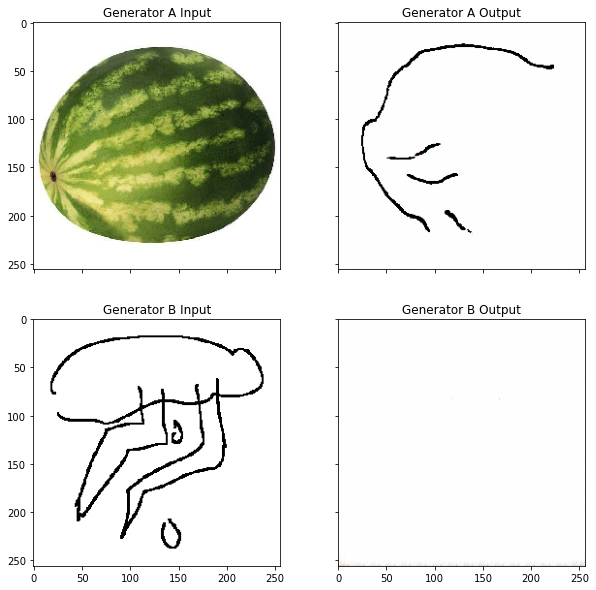

Time taken for epoch 0 batch index 33000 is 3448.5285120010376 seconds

discriminator A:  0.5347606
discriminator B:  0.026738781
generator: 74.01132202148438



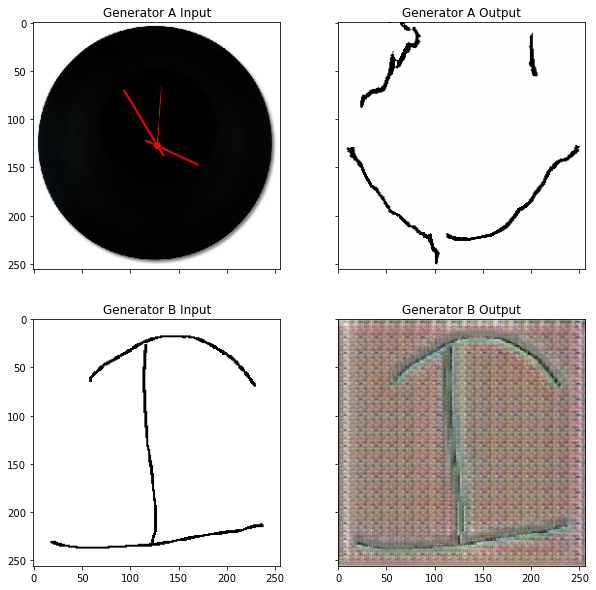

Time taken for epoch 0 batch index 34000 is 3556.6513748168945 seconds

discriminator A:  0.7282206
discriminator B:  0.063132964
generator: 106.20204162597656



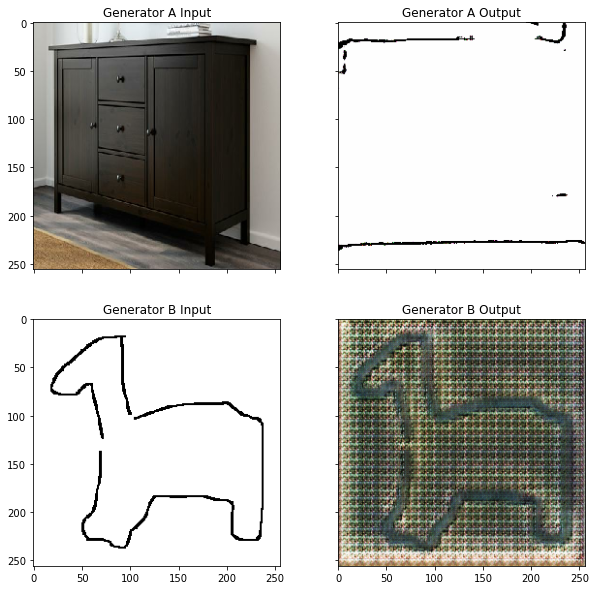

Time taken for epoch 0 batch index 35000 is 3665.2625031471252 seconds

discriminator A:  2.456923
discriminator B:  0.23572488
generator: 121.64508056640625



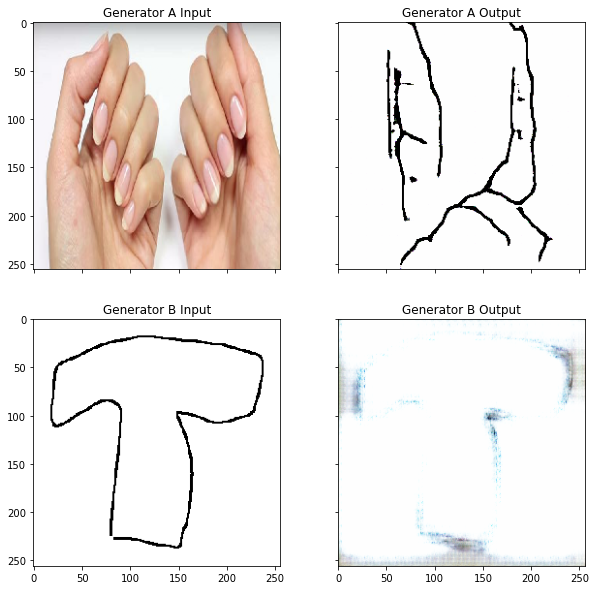

Time taken for epoch 0 batch index 36000 is 3772.60466337204 seconds

discriminator A:  1.4413861
discriminator B:  0.0062330095
generator: 71.60507202148438



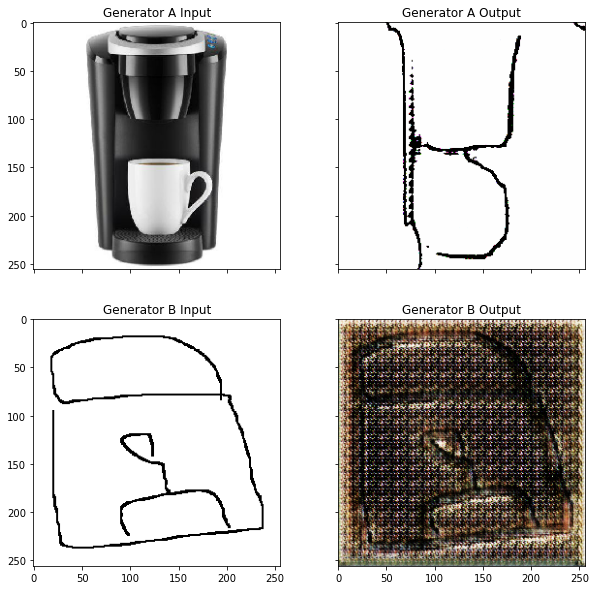

Time taken for epoch 0 batch index 37000 is 3880.7673580646515 seconds

discriminator A:  0.34551358
discriminator B:  0.056829765
generator: 73.4059066772461



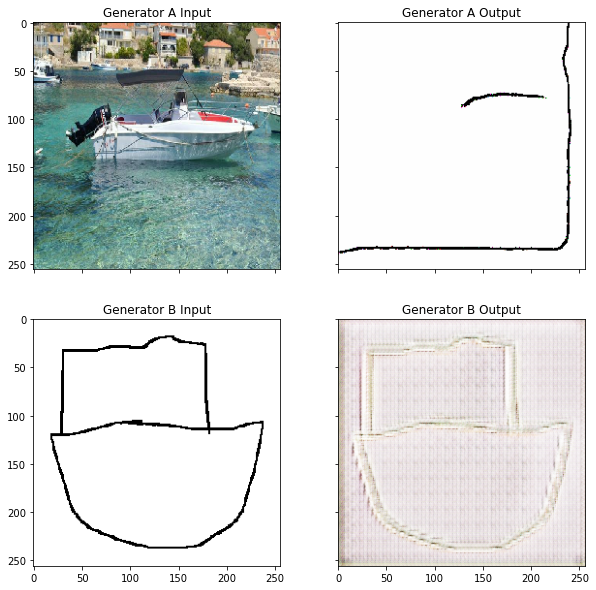

Time taken for epoch 0 batch index 38000 is 3991.4839911460876 seconds

discriminator A:  1.3963377
discriminator B:  0.018844167
generator: 157.08677673339844



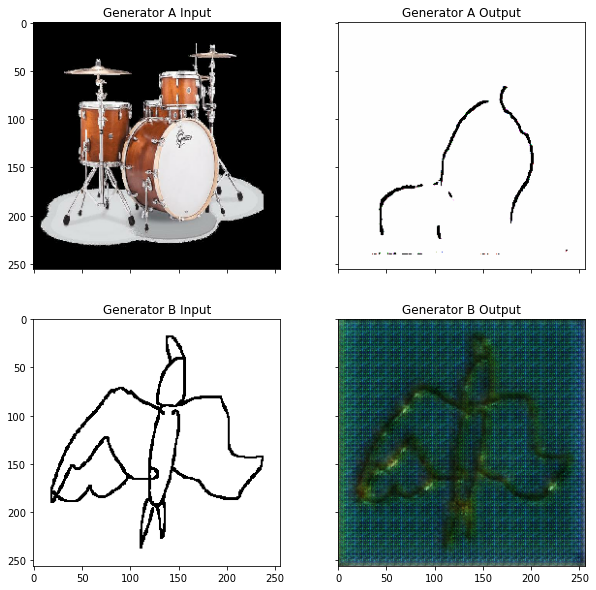

Time taken for epoch 0 batch index 39000 is 4100.632691383362 seconds

discriminator A:  0.3953581
discriminator B:  0.007928783
generator: 76.16661071777344



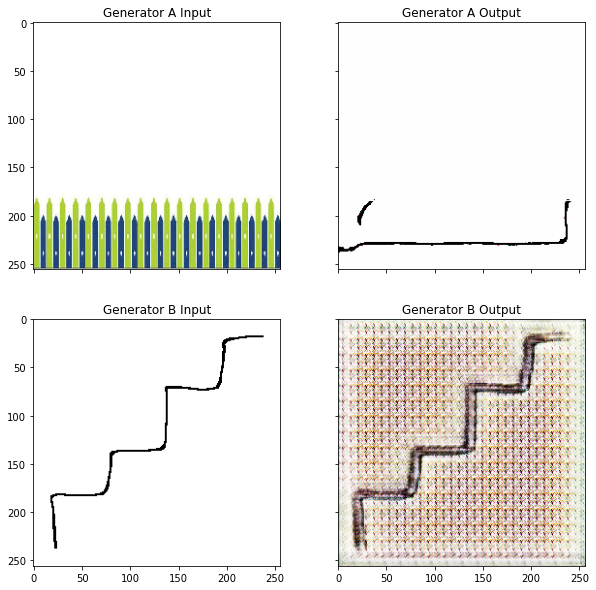

Time taken for epoch 0 batch index 40000 is 4208.326667070389 seconds

discriminator A:  0.27813885
discriminator B:  0.00756275
generator: 77.6557846069336



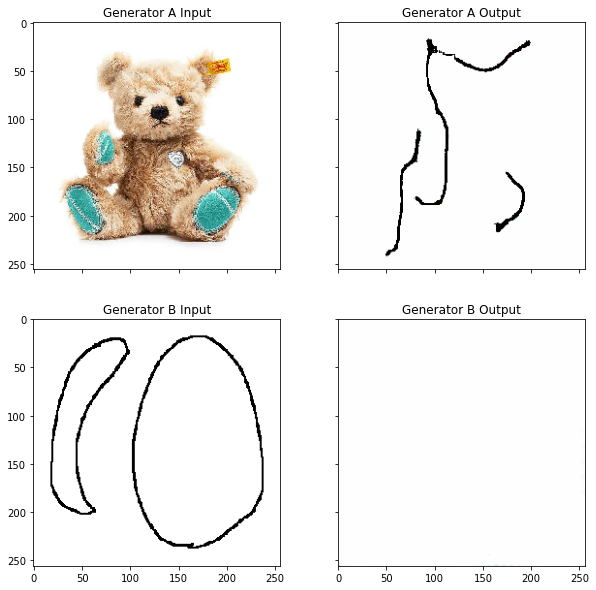

Time taken for epoch 0 batch index 41000 is 4318.148634433746 seconds

discriminator A:  1.9650524
discriminator B:  0.0064121853
generator: 120.02925109863281



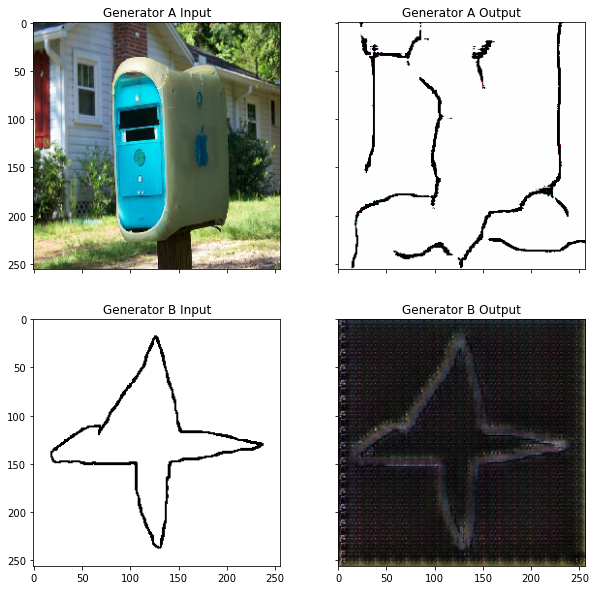

Time taken for epoch 0 batch index 42000 is 4429.083368778229 seconds

discriminator A:  0.3982703
discriminator B:  0.08012795
generator: 40.410736083984375



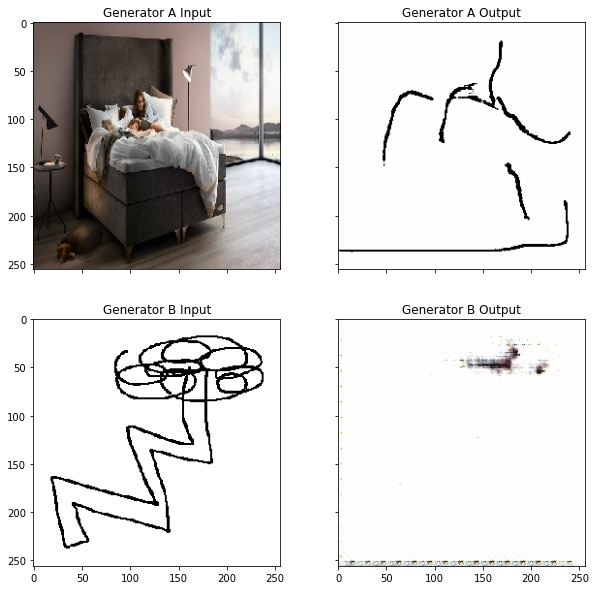

Time taken for epoch 0 batch index 43000 is 4543.684506177902 seconds

discriminator A:  0.22018051
discriminator B:  0.014812386
generator: 109.65354919433594



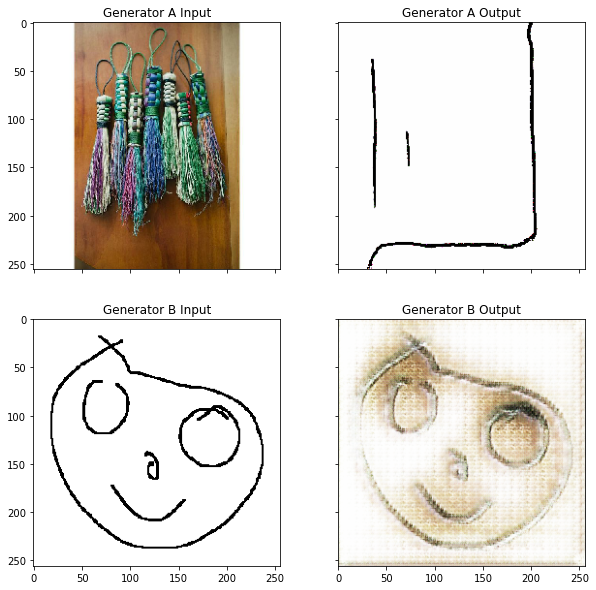

Time taken for epoch 0 batch index 44000 is 4660.867694139481 seconds

discriminator A:  0.16956836
discriminator B:  1.0215164
generator: 75.09869384765625



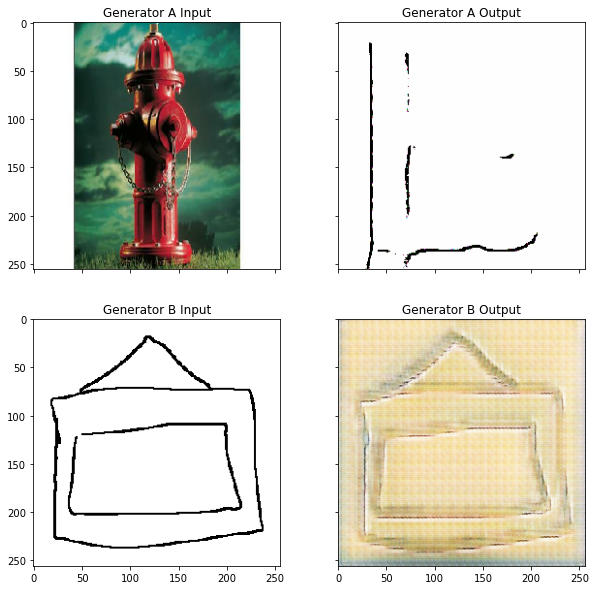

Time taken for epoch 0 batch index 45000 is 4774.288066148758 seconds

discriminator A:  0.13190442
discriminator B:  0.0056623793
generator: 90.80060577392578



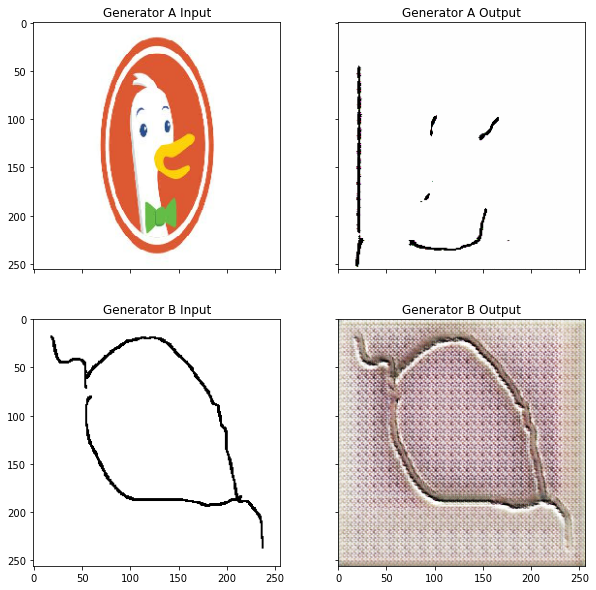

Time taken for epoch 0 batch index 46000 is 4889.2865471839905 seconds

discriminator A:  0.39371058
discriminator B:  0.006047567
generator: 124.63011169433594



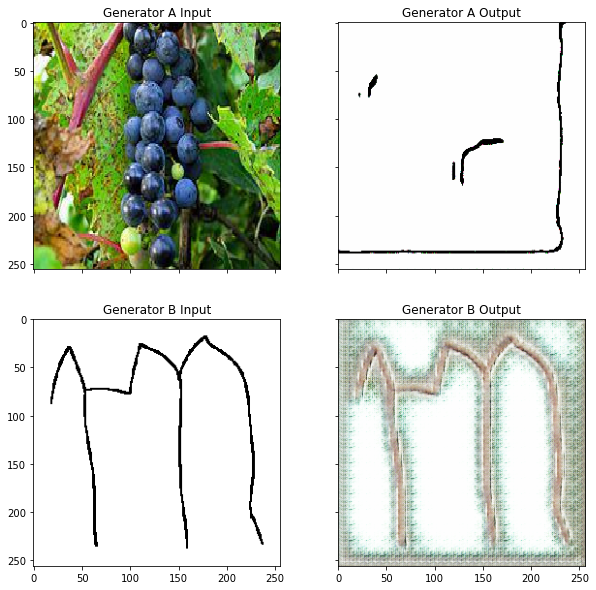

Time taken for epoch 0 batch index 47000 is 5009.201524972916 seconds

discriminator A:  0.46872953
discriminator B:  0.018749367
generator: 57.101280212402344



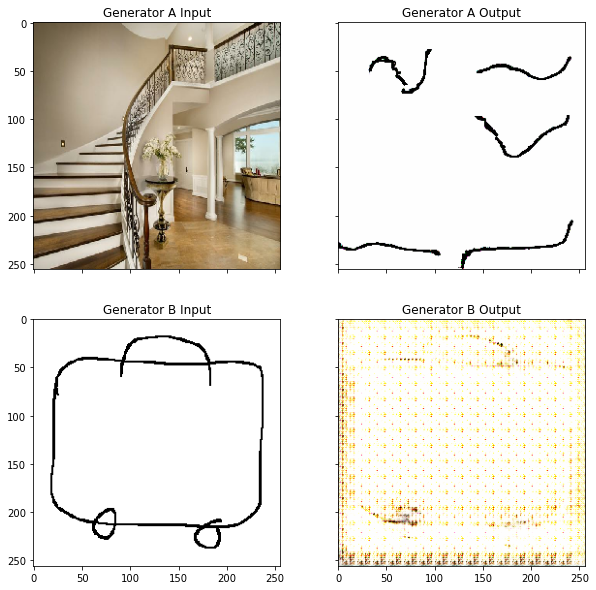

Time taken for epoch 0 batch index 48000 is 5125.396275043488 seconds

discriminator A:  0.5975032
discriminator B:  0.00757429
generator: 67.48095703125



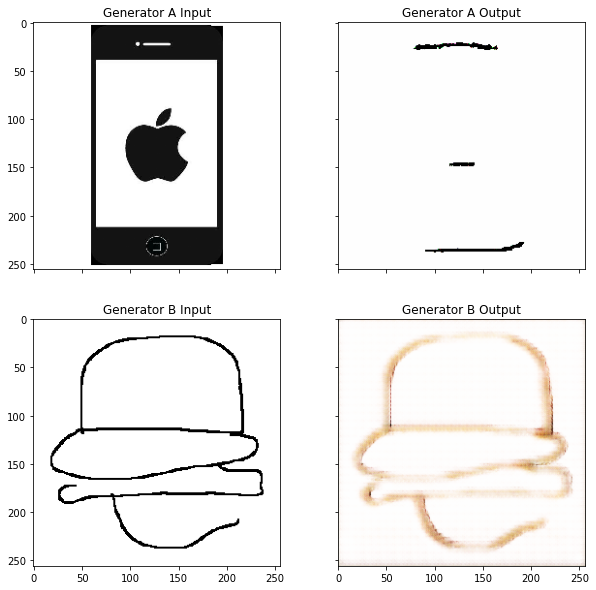

Time taken for epoch 0 batch index 49000 is 5243.185963153839 seconds

discriminator A:  0.85973346
discriminator B:  0.0032764412
generator: 107.71501922607422



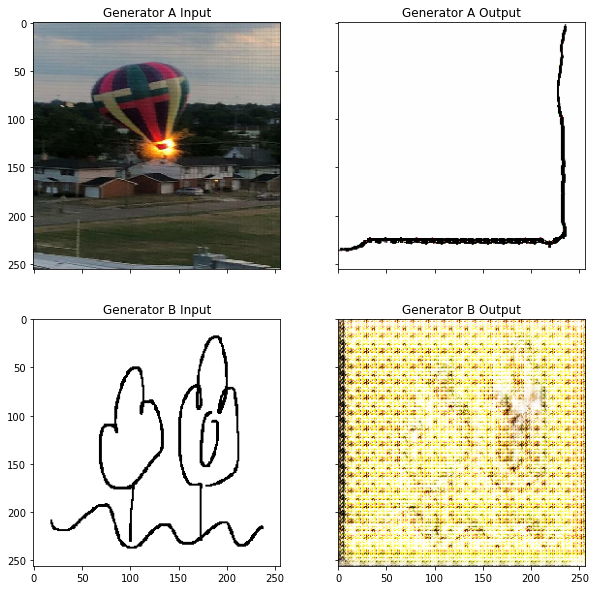

Time taken for epoch 0 batch index 50000 is 5361.989770650864 seconds

discriminator A:  0.36432827
discriminator B:  0.007673771
generator: 71.59211730957031



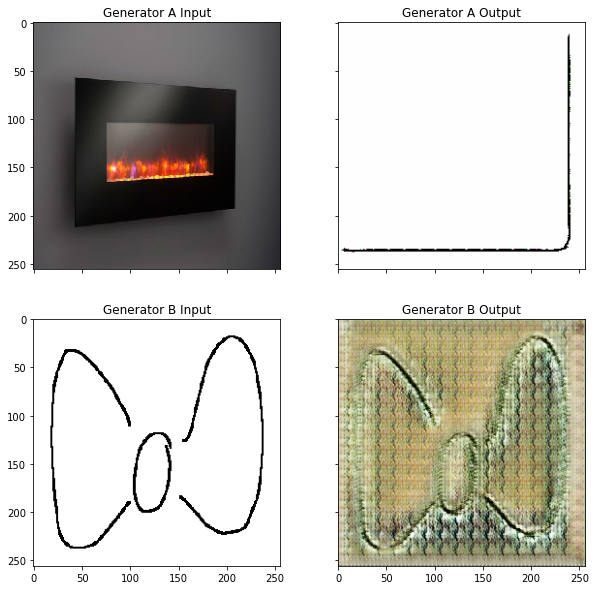

Time taken for epoch 0 batch index 51000 is 5485.266713142395 seconds

discriminator A:  0.3134383
discriminator B:  0.45974386
generator: 54.51481246948242



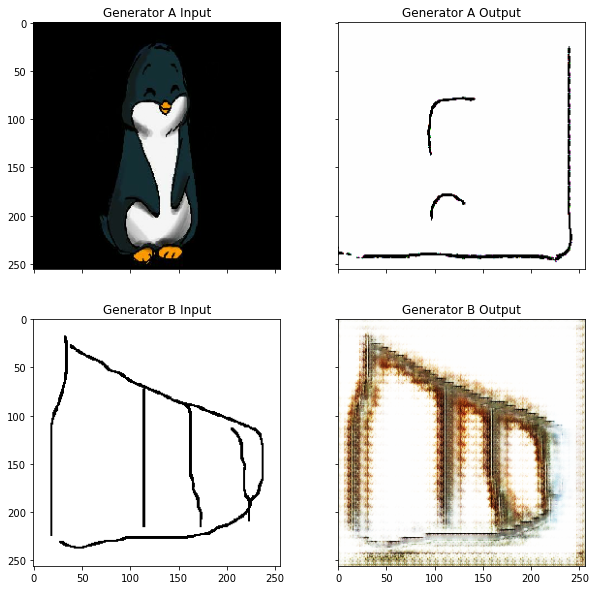

Exception ignored in: <function IteratorResourceDeleter.__del__ at 0x000001E507B80C10>
Traceback (most recent call last):
  File "C:\Users\cvpr\AppData\Roaming\Python\Python38\site-packages\tensorflow\python\data\ops\iterator_ops.py", line 534, in __del__
    gen_dataset_ops.delete_iterator(
  File "C:\Users\cvpr\AppData\Roaming\Python\Python38\site-packages\tensorflow\python\ops\gen_dataset_ops.py", line 1262, in delete_iterator
    _result = pywrap_tfe.TFE_Py_FastPathExecute(
KeyboardInterrupt: 


KeyboardInterrupt: 

In [31]:
train(train_A, train_B, EPOCHS)

In [32]:
discriminator_A.save_weights('discriminator_A.h5')
discriminator_B.save_weights('discriminator_B.h5')
generator_AB.save_weights('generator_AB.h5')
generator_BA.save_weights('generator_BA.h5')

In [33]:
discriminator_A.load_weights('./discriminator_A.h5')
discriminator_B.load_weights('./discriminator_B.h5')
generator_AB.load_weights('./generator_AB.h5')
generator_BA.load_weights('./generator_BA.h5')

## 시험

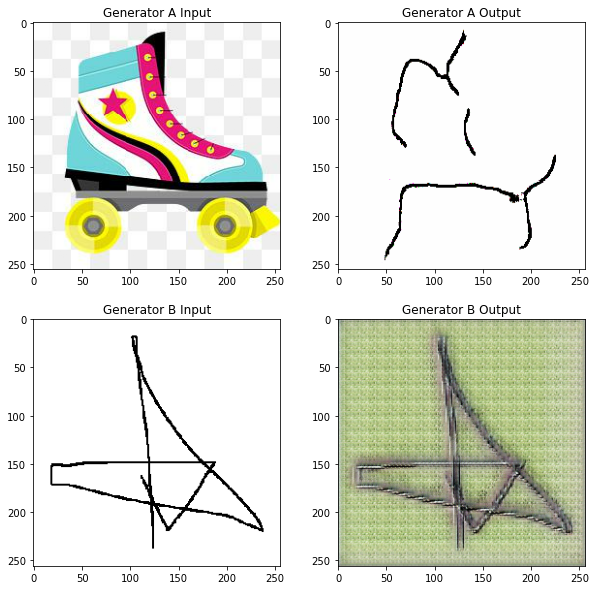

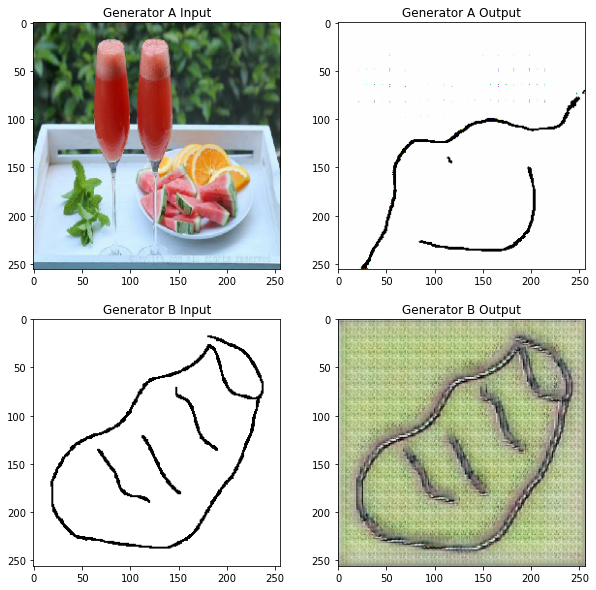

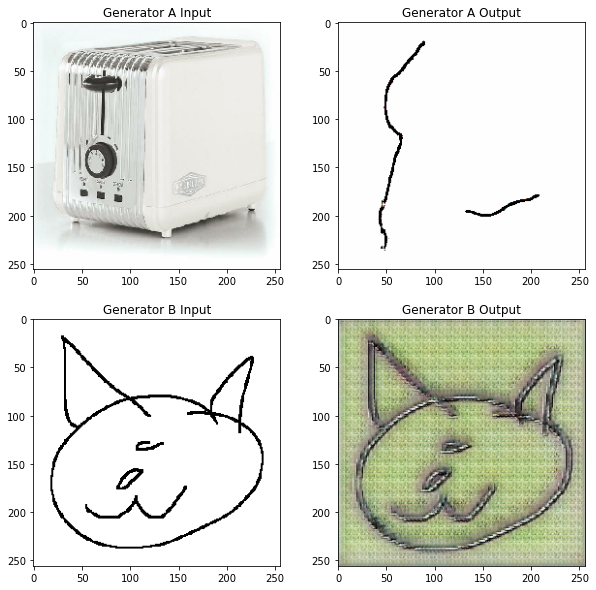

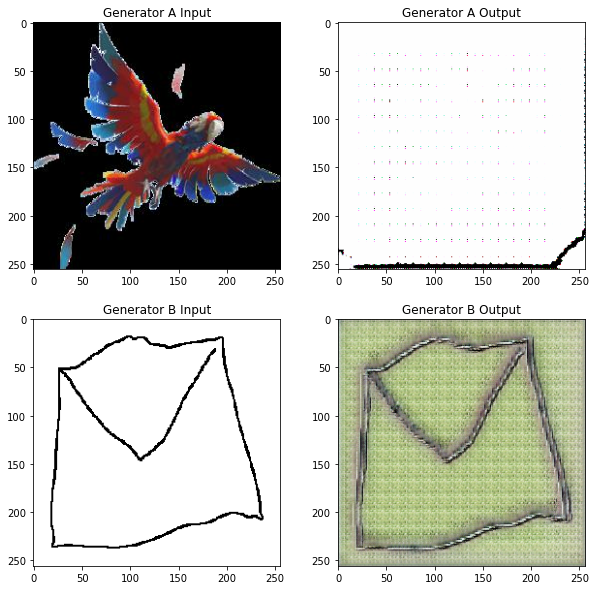

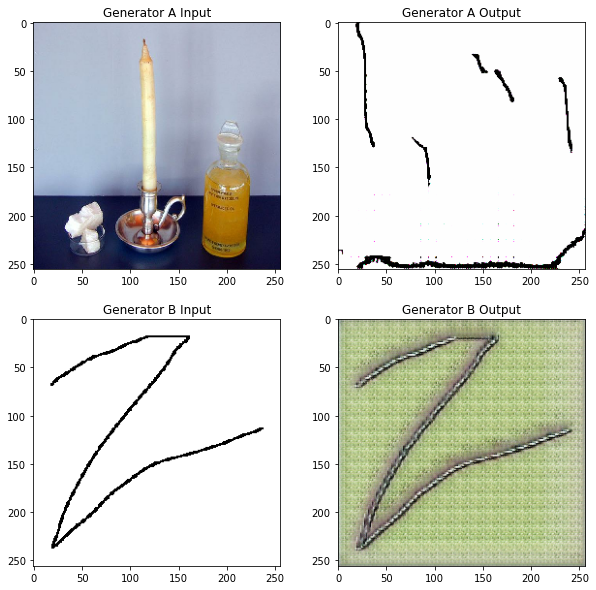

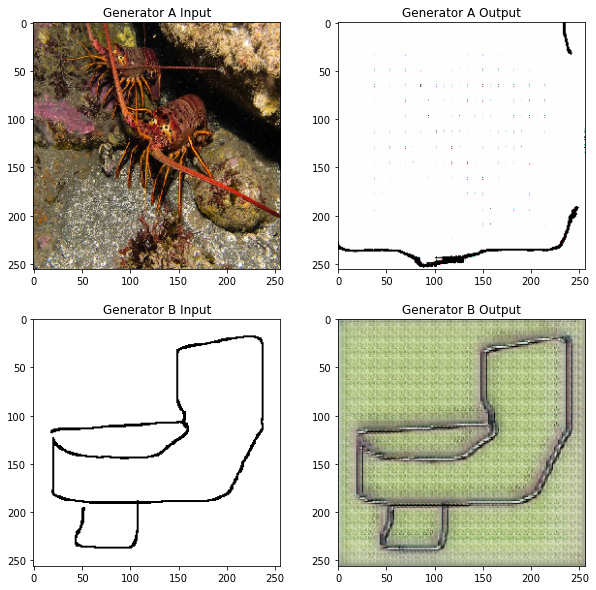

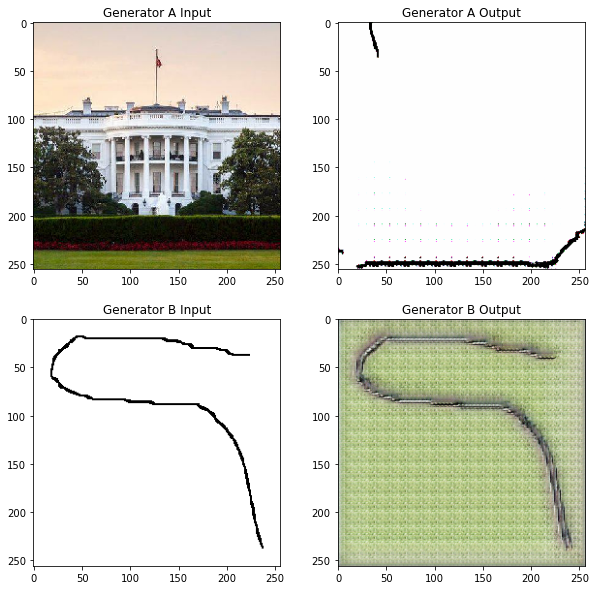

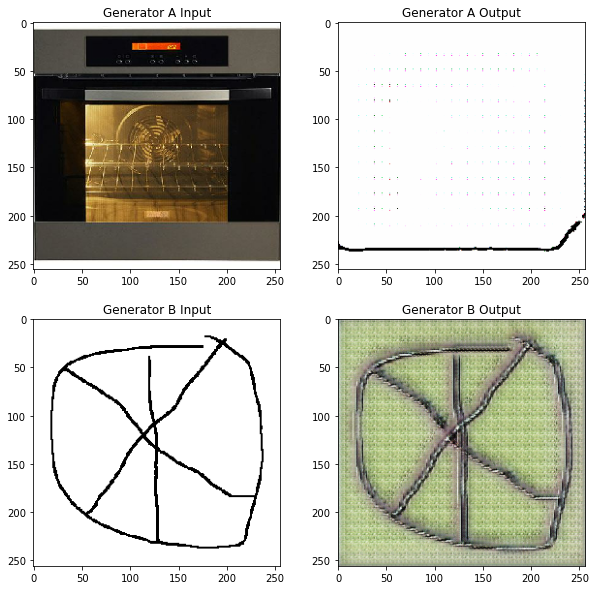

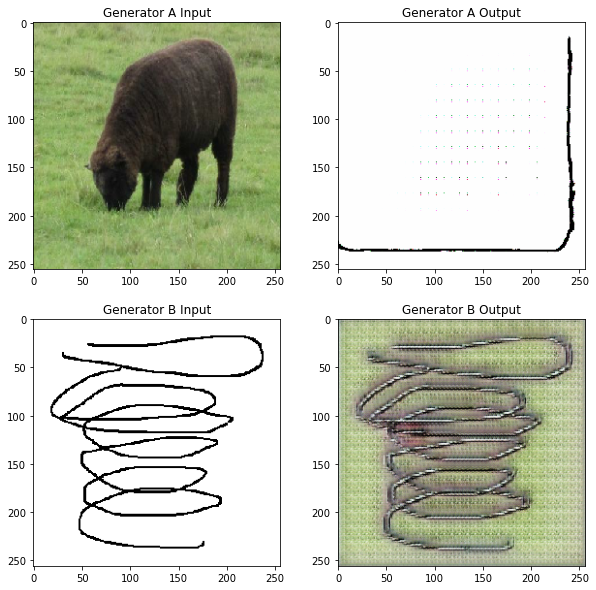

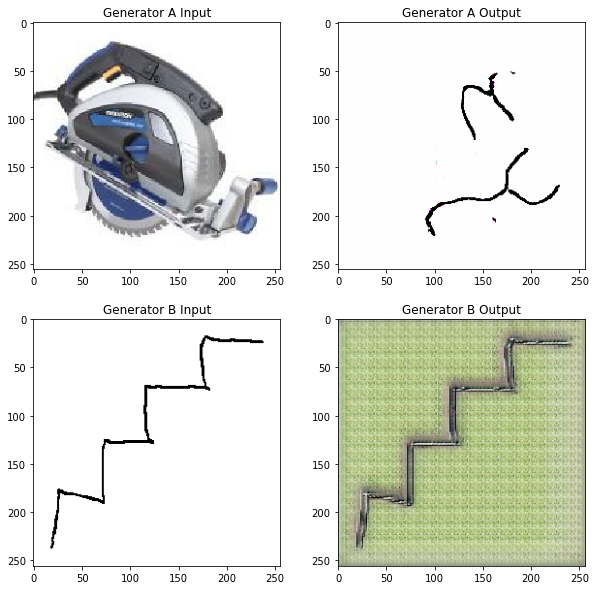

In [34]:
count = 10
for batch_i, (imgs_A, imgs_B) in enumerate(zip(test_A, test_B)):
    fake_B = generator_AB(imgs_A, training=False)
    fake_A = generator_BA(imgs_B, training=False)
    
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))

    axs[0,0].imshow(imgs_A[0]*0.5 + 0.5)
    axs[0,0].set_title("Generator A Input")
    axs[0,1].imshow(fake_B[0]*0.5 + 0.5)
    axs[0,1].set_title("Generator A Output")
    axs[1,0].imshow(imgs_B[0]*0.5 + 0.5)
    axs[1,0].set_title("Generator B Input")
    axs[1,1].imshow(fake_A[0]*0.5 + 0.5)
    axs[1,1].set_title("Generator B Output")
    plt.show()
    
    count -= 1
    if count <= 0:
        break